<a href="https://colab.research.google.com/github/akula381/C--/blob/main/bank.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import plot_tree
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import plot_confusion_matrix

campaign = pd.read_csv('https://raw.githubusercontent.com/byui-cse/cse450-course/master/data/bank.csv')
pd.set_option('display.max_rows', 20)
pd.set_option('display.max_columns', 20)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', None)
campaign.shape

(41188, 20)

In [ ]:
campaign.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
0,56,housemaid,married,basic.4y,no,no,no,telephone,may,mon,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
1,57,services,married,high.school,unknown,no,no,telephone,may,mon,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
2,37,services,married,high.school,no,yes,no,telephone,may,mon,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
3,40,admin.,married,basic.6y,no,no,no,telephone,may,mon,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no
4,56,services,married,high.school,no,no,yes,telephone,may,mon,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,no


In [ ]:
campaign["job"].value_counts()

admin.           10422
blue-collar       9254
technician        6743
services          3969
management        2924
retired           1720
entrepreneur      1456
self-employed     1421
housemaid         1060
unemployed        1014
student            875
unknown            330
Name: job, dtype: int64

In [ ]:
campaign["marital"].value_counts()

married     24928
single      11568
divorced     4612
unknown        80
Name: marital, dtype: int64

In [ ]:
campaign["education"].value_counts()

university.degree      12168
high.school             9515
basic.9y                6045
professional.course     5243
basic.4y                4176
basic.6y                2292
unknown                 1731
illiterate                18
Name: education, dtype: int64

In [ ]:
campaign["default"].value_counts()

no         32588
unknown     8597
yes            3
Name: default, dtype: int64

In [ ]:
campaign["housing"].value_counts()

yes        21576
no         18622
unknown      990
Name: housing, dtype: int64

In [ ]:
campaign["loan"].value_counts()

no         33950
yes         6248
unknown      990
Name: loan, dtype: int64

In [ ]:
campaign["contact"].value_counts()

cellular     26144
telephone    15044
Name: contact, dtype: int64

In [ ]:
campaign["month"].value_counts()

may    13769
jul     7174
aug     6178
jun     5318
nov     4101
apr     2632
oct      718
sep      570
mar      546
dec      182
Name: month, dtype: int64

In [ ]:
campaign["day_of_week"].value_counts()

thu    8623
mon    8514
wed    8134
tue    8090
fri    7827
Name: day_of_week, dtype: int64

In [ ]:
campaign["campaign"].value_counts()

1     17642
2     10570
3      5341
4      2651
5      1599
      ...  
43        2
37        1
39        1
41        1
56        1
Name: campaign, Length: 42, dtype: int64

In [ ]:
campaign["pdays"].value_counts()

999    39673
3        439
6        412
4        118
9         64
       ...  
21         2
26         1
20         1
25         1
27         1
Name: pdays, Length: 27, dtype: int64

In [ ]:
campaign["previous"].value_counts()

0    35563
1     4561
2      754
3      216
4       70
5       18
6        5
7        1
Name: previous, dtype: int64

In [ ]:
campaign["poutcome"].value_counts()

nonexistent    35563
failure         4252
success         1373
Name: poutcome, dtype: int64

In [ ]:
campaign["emp.var.rate"].value_counts()

 1.4    16234
-1.8     9184
 1.1     7763
-0.1     3683
-2.9     1663
-3.4     1071
-1.7      773
-1.1      635
-3.0      172
-0.2       10
Name: emp.var.rate, dtype: int64

In [ ]:
campaign["cons.price.idx"].value_counts()

93.994    7763
93.918    6685
92.893    5794
93.444    5175
94.465    4374
          ... 
93.749     174
92.713     172
94.767     128
93.798      67
92.756      10
Name: cons.price.idx, Length: 26, dtype: int64

In [ ]:
campaign["cons.conf.idx"].value_counts()

-36.4    7763
-42.7    6685
-46.2    5794
-36.1    5175
-41.8    4374
         ... 
-34.6     174
-33.0     172
-50.8     128
-40.4      67
-45.9      10
Name: cons.conf.idx, Length: 26, dtype: int64

In [ ]:
campaign["euribor3m"].value_counts()

4.857    2868
4.962    2613
4.963    2487
4.961    1902
4.856    1210
         ... 
1.045       1
0.956       1
0.933       1
3.282       1
0.996       1
Name: euribor3m, Length: 316, dtype: int64

In [ ]:
campaign["nr.employed"].value_counts()

5228.1    16234
5099.1     8534
5191.0     7763
5195.8     3683
5076.2     1663
5017.5     1071
4991.6      773
5008.7      650
4963.6      635
5023.5      172
5176.3       10
Name: nr.employed, dtype: int64

In [ ]:
campaign["y"].value_counts()

no     36548
yes     4640
Name: y, dtype: int64

In [ ]:
campaign.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 20 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             41188 non-null  int64  
 1   job             41188 non-null  object 
 2   marital         41188 non-null  object 
 3   education       41188 non-null  object 
 4   default         41188 non-null  object 
 5   housing         41188 non-null  object 
 6   loan            41188 non-null  object 
 7   contact         41188 non-null  object 
 8   month           41188 non-null  object 
 9   day_of_week     41188 non-null  object 
 10  campaign        41188 non-null  int64  
 11  pdays           41188 non-null  int64  
 12  previous        41188 non-null  int64  
 13  poutcome        41188 non-null  object 
 14  emp.var.rate    41188 non-null  float64
 15  cons.price.idx  41188 non-null  float64
 16  cons.conf.idx   41188 non-null  float64
 17  euribor3m       41188 non-null 

In [ ]:
campaign["y"] = campaign["y"].replace("yes", 1)
campaign["y"] = campaign["y"].replace("no", 0)

In [ ]:
import numpy as np
campaign.y.value_counts()
# 36548 for 0 (no), 4640 for yes (1)
# We need to undersample the nos

# Take all the yes's
yes_indices = campaign.query('y == 1').index.values

# Take 4640 of the no's
no_indices = campaign.query('y == 0').index.values
np.random.seed(42)
sample_size = sum(campaign.y == 1)
sample_indices = np.random.choice(no_indices, sample_size, replace=False)

# Combine these to create a balanced dataset
balanced_indices = np.concatenate((yes_indices, sample_indices))
c_bal = campaign.loc[balanced_indices]
campaign=c_bal

In [ ]:
campaign.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,y
75,41,blue-collar,divorced,basic.4y,unknown,yes,no,telephone,may,mon,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,1
83,49,entrepreneur,married,university.degree,unknown,yes,no,telephone,may,mon,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,1
88,49,technician,married,basic.9y,no,no,no,telephone,may,mon,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,1
129,41,technician,married,professional.course,unknown,yes,no,telephone,may,mon,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,1
139,45,blue-collar,married,basic.9y,unknown,yes,no,telephone,may,mon,1,999,0,nonexistent,1.1,93.994,-36.4,4.857,5191.0,1


In [ ]:
bins = [0, 1, 2, 3, 4,5]
labels=[1,2,3,4,5]
campaign['binned_euribor3m'] = pd.cut(campaign['euribor3m'], bins=bins,labels=labels)
campaign.binned_euribor3m.value_counts()
# campaign["euribor3m"].drop()
campaign = campaign.drop('euribor3m', 1)

In [ ]:
#campaign = campaign.drop('default', 1)
#campaign['y'].head()

#dfyy = campaign['y']

# campaign["poutcome"].value_counts()
# campaign = pd.get_dummies(campaign,columns=['job', 'marital',"education","default","housing","loan","contact","month","day_of_week","campaign","pdays","previous","poutcome","previous","emp.var.rate","cons.price.idx","cons.conf.idx","nr.employed"])

pd.options.display.max_columns = None
pd.options.display.max_rows = None


In [ ]:
print(campaign.columns.tolist())

['age', 'job', 'marital', 'education', 'default', 'housing', 'loan', 'contact', 'month', 'day_of_week', 'campaign', 'pdays', 'previous', 'poutcome', 'emp.var.rate', 'cons.price.idx', 'cons.conf.idx', 'nr.employed', 'y', 'binned_euribor3m']


In [ ]:
len(campaign)

9280

In [ ]:
campaign.head()

,age,job,marital,education,default,housing,loan,contact,month,day_of_week,campaign,pdays,previous,poutcome,emp.var.rate,cons.price.idx,cons.conf.idx,nr.employed,y,binned_euribor3m
75,41,blue-collar,divorced,basic.4y,unknown,yes,no,telephone,may,mon,1,999,0,nonexistent,1.1,93.994,-36.4,5191.0,1,5
83,49,entrepreneur,married,university.degree,unknown,yes,no,telephone,may,mon,1,999,0,nonexistent,1.1,93.994,-36.4,5191.0,1,5
88,49,technician,married,basic.9y,no,no,no,telephone,may,mon,1,999,0,nonexistent,1.1,93.994,-36.4,5191.0,1,5
129,41,technician,married,professional.course,unknown,yes,no,telephone,may,mon,1,999,0,nonexistent,1.1,93.994,-36.4,5191.0,1,5
139,45,blue-collar,married,basic.9y,unknown,yes,no,telephone,may,mon,1,999,0,nonexistent,1.1,93.994,-36.4,5191.0,1,5


In [ ]:
# new_subset = campaign.replace({"housing": "no",
#                              "loan":"no"}, int(0))
# new_subset = new_subset.replace({"education": "illiterate",
#                              "housing": "yes",
#                              "loan": "yes"}, int(1))
# new_subset = new_subset.replace("basic.4y", int(2))
# new_subset = new_subset.replace("basic.6y", int(3))
# new_subset = new_subset.replace("basic.9y", int(4))
# new_subset = new_subset.replace("high.school", int(5))
# new_subset = new_subset.replace("professional.course", int(6))
# new_subset = new_subset.replace("university.degree", int(7))
# find_average = new_subset[new_subset["education"] != "unknown"]
# # new_subset
# average = find_average["education"].mean()
# new_subset = new_subset.replace({"education" : "unknown"}, average)
# new_subset

# temp = new_subset[new_subset["housing"] != "unknown"]
# housing_average = temp["housing"].mean()
# new_subset = new_subset.replace({"housing" : "unknown"}, housing_average)
# new_subset

# temp = new_subset[new_subset["loan"] != "unknown"]
# loan_average = temp["loan"].mean()
# new_subset = new_subset.replace({"loan" : "unknown"}, loan_average)
# new_subset

In [ ]:
# for i,n in enumerate(campaign["euribor3m"]):
#   if (campaign["euribor3m"]>0 & campaign["euribor3m"]<1.1):
#     campaign["new_col_euribor3m"]=1
#   if (campaign["euribor3m"]>1.1 and campaign["euribor3m"])<2.1:
#     campaign["new_col_euribor3m"]=2
#   if (campaign["euribor3m"]>2.1 and campaign["euribor3m"])<3.1:
#     campaign["new_col_euribor3m"]=3
#   if (campaign["euribor3m"]>3.1 and campaign["euribor3m"])<4.1:
#     campaign["new_col_euribor3m"]=4
#   else:
#     campaign["new_col_euribor3m"]=5

In [ ]:
#dfyy.head()

In [ ]:
import altair as alt
raw = pd.read_csv('https://raw.githubusercontent.com/byui-cse/cse450-course/master/data/bank.csv')
alt.data_transformers.enable('default', max_rows=None)
success = raw[raw['y'] == "yes"]
failure = raw[raw['y'] == "no"]

chart1 = alt.Chart(success[["contact", "y"]]).mark_bar().encode(
    alt.Y('contact', type='nominal'),
    alt.X('contact', type='quantitative', aggregate='count')  
).properties(
    title = 'Number of Successful Term Deposit Accounts by Contact Method'
)

chart2 = alt.Chart(failure[["contact", "y"]]).mark_bar().encode(
    alt.Y('contact', type='nominal'),
    alt.X('contact', type='quantitative', aggregate='count')  
).properties(
    title = 'Number of Unsuccessful Term Deposit Accounts by Contact Method'
)
chart1 & chart2

alt.VConcatChart(...)

In [ ]:
print(success["contact"].value_counts())
print(3853 / (3853+787), 787 / (3853+787), "\n\n")
print(failure["contact"].value_counts())
print(22291 / (22291 + 14257), 14257 / (22291 + 14257))

cellular     3853
telephone     787
Name: contact, dtype: int64
0.8303879310344827 0.16961206896551725 


cellular     22291
telephone    14257
Name: contact, dtype: int64
0.6099102550071139 0.39008974499288607


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


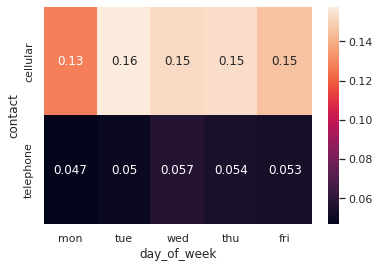

In [ ]:
import seaborn as sns; sns.set_theme()

con_dayofweek = raw[["day_of_week", "contact", "y"]]

con_dayofweek["y"] = con_dayofweek["y"].replace("yes", 1)
con_dayofweek["y"] = con_dayofweek["y"].replace("no", 0)

con_dayofweek2 = con_dayofweek.pivot_table("y", index="contact", columns="day_of_week")

column_order = ["mon", "tue", "wed", "thu", "fri"]
con_dayofweek3 = con_dayofweek2.reindex(column_order, axis=1)

ax = sns.heatmap(con_dayofweek3, annot=True)
ax

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


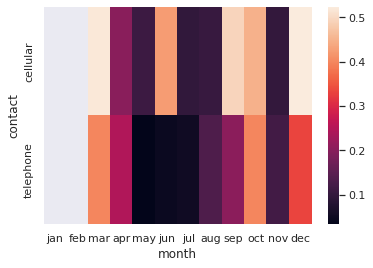

In [ ]:
import seaborn as sns; sns.set_theme()

con_month = raw[["month", "contact", "y"]]

con_month["y"] = con_month["y"].replace("yes", 1)
con_month["y"] = con_month["y"].replace("no", 0)

con_month2 = con_month.pivot_table("y", index="contact", columns="month")

column_order = ["jan", "feb", "mar", "apr", "may", "jun", "jul", "aug", "sep", "oct", "nov", "dec"]
con_month3 = con_month2.reindex(column_order, axis=1)

ax = sns.heatmap(con_month3)
ax

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


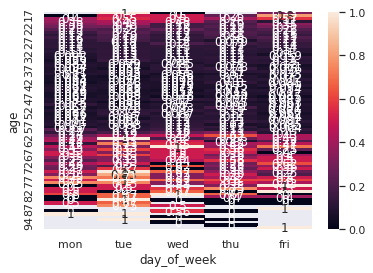

In [ ]:
import seaborn as sns; sns.set_theme()

age_dayofweek = raw[["day_of_week", "age", "y"]]

age_dayofweek["y"] = age_dayofweek["y"].replace("yes", 1)
age_dayofweek["y"] = age_dayofweek["y"].replace("no", 0)

age_dayofweek2 = age_dayofweek.pivot_table("y", index="age", columns="day_of_week")

column_order = ["mon", "tue", "wed", "thu", "fri"]
age_dayofweek3 = age_dayofweek2.reindex(column_order, axis=1)

ax = sns.heatmap(age_dayofweek3, annot=True)
ax

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


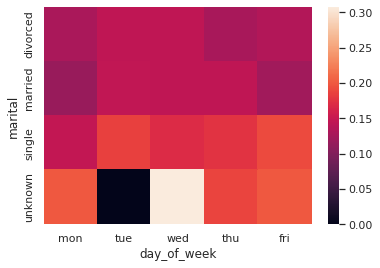

In [ ]:
import seaborn as sns; sns.set_theme()
called = raw[raw["contact"] == "cellular"]

mar_dayofweek = called[["day_of_week", "marital", "y"]]

mar_dayofweek["y"] = mar_dayofweek["y"].replace("yes", 1)
mar_dayofweek["y"] = mar_dayofweek["y"].replace("no", 0)

mar_dayofweek2 = mar_dayofweek.pivot_table("y", index="marital", columns="day_of_week")

column_order = ["mon", "tue", "wed", "thu", "fri"]
mar_dayofweek3 = mar_dayofweek2.reindex(column_order, axis=1)

ax = sns.heatmap(mar_dayofweek3)
ax

In [ ]:
campaign['month'].value_counts()

may    2545
jul    1491
aug    1358
jun    1146
nov     869
apr     799
oct     365
mar     311
sep     294
dec     102
Name: month, dtype: int64

In [ ]:
modified = campaign[campaign["job"] != "unknown"]
modified = modified[campaign["marital"] != "unknown"]
modified.shape

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


(9191, 20)

In [ ]:
values = ["age", "job", "marital", "education", "housing", "loan", "y"]
subset = modified[values]
subset.shape

(9191, 7)

In [ ]:
new_subset = subset.replace({"housing": "no",
                             "loan":"no"}, int(0))
new_subset = new_subset.replace({"education": "illiterate",
                             "housing": "yes",
                             "loan": "yes"}, int(1))
new_subset = new_subset.replace("basic.4y", int(2))
new_subset = new_subset.replace("basic.6y", int(3))
new_subset = new_subset.replace("basic.9y", int(4))
new_subset = new_subset.replace("high.school", int(5))
new_subset = new_subset.replace("professional.course", int(6))
new_subset = new_subset.replace("university.degree", int(7))
find_average = new_subset[new_subset["education"] != "unknown"]
# new_subset
average = find_average["education"].mean()
new_subset = new_subset.replace({"education" : "unknown"}, average)
new_subset

,age,job,marital,education,housing,loan,y
75,41,blue-collar,divorced,2.000000,1,0,1
83,49,entrepreneur,married,7.000000,1,0,1
88,49,technician,married,4.000000,0,0,1
129,41,technician,married,6.000000,1,0,1
139,45,blue-collar,married,4.000000,1,0,1
182,42,blue-collar,married,4.000000,1,1,1
286,39,housemaid,married,4.000000,1,0,1
389,44,services,married,5.000000,1,0,1
446,42,technician,married,6.000000,0,0,1
469,42,management,married,7.000000,0,0,1


In [ ]:
temp = new_subset[new_subset["housing"] != "unknown"]
housing_average = temp["housing"].mean()
new_subset = new_subset.replace({"housing" : "unknown"}, housing_average)
new_subset

,age,job,marital,education,housing,loan,y
75,41,blue-collar,divorced,2.000000,1.000000,0,1
83,49,entrepreneur,married,7.000000,1.000000,0,1
88,49,technician,married,4.000000,0.000000,0,1
129,41,technician,married,6.000000,1.000000,0,1
139,45,blue-collar,married,4.000000,1.000000,0,1
182,42,blue-collar,married,4.000000,1.000000,1,1
286,39,housemaid,married,4.000000,1.000000,0,1
389,44,services,married,5.000000,1.000000,0,1
446,42,technician,married,6.000000,0.000000,0,1
469,42,management,married,7.000000,0.000000,0,1


In [ ]:
temp = new_subset[new_subset["loan"] != "unknown"]
loan_average = temp["loan"].mean()
new_subset = new_subset.replace({"loan" : "unknown"}, loan_average)
new_subset

,age,job,marital,education,housing,loan,y
75,41,blue-collar,divorced,2.000000,1.000000,0.000000,1
83,49,entrepreneur,married,7.000000,1.000000,0.000000,1
88,49,technician,married,4.000000,0.000000,0.000000,1
129,41,technician,married,6.000000,1.000000,0.000000,1
139,45,blue-collar,married,4.000000,1.000000,0.000000,1
182,42,blue-collar,married,4.000000,1.000000,1.000000,1
286,39,housemaid,married,4.000000,1.000000,0.000000,1
389,44,services,married,5.000000,1.000000,0.000000,1
446,42,technician,married,6.000000,0.000000,0.000000,1
469,42,management,married,7.000000,0.000000,0.000000,1


In [ ]:
X = new_subset.drop('y', 1).copy()
X

,age,job,marital,education,housing,loan
75,41,blue-collar,divorced,2.000000,1.000000,0.000000
83,49,entrepreneur,married,7.000000,1.000000,0.000000
88,49,technician,married,4.000000,0.000000,0.000000
129,41,technician,married,6.000000,1.000000,0.000000
139,45,blue-collar,married,4.000000,1.000000,0.000000
182,42,blue-collar,married,4.000000,1.000000,1.000000
286,39,housemaid,married,4.000000,1.000000,0.000000
389,44,services,married,5.000000,1.000000,0.000000
446,42,technician,married,6.000000,0.000000,0.000000
469,42,management,married,7.000000,0.000000,0.000000


In [ ]:
X_encoded = pd.get_dummies(X, columns=['job', 'marital'])
X_encoded
X_encoded.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9191 entries, 75 to 13742
Data columns (total 18 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   age                9191 non-null   int64  
 1   education          9191 non-null   float64
 2   housing            9191 non-null   float64
 3   loan               9191 non-null   float64
 4   job_admin.         9191 non-null   uint8  
 5   job_blue-collar    9191 non-null   uint8  
 6   job_entrepreneur   9191 non-null   uint8  
 7   job_housemaid      9191 non-null   uint8  
 8   job_management     9191 non-null   uint8  
 9   job_retired        9191 non-null   uint8  
 10  job_self-employed  9191 non-null   uint8  
 11  job_services       9191 non-null   uint8  
 12  job_student        9191 non-null   uint8  
 13  job_technician     9191 non-null   uint8  
 14  job_unemployed     9191 non-null   uint8  
 15  marital_divorced   9191 non-null   uint8  
 16  marital_married    919

In [ ]:
y = campaign['y'].copy()
y

75       1
83       1
88       1
129      1
139      1
182      1
286      1
388      1
389      1
446      1
469      1
504      1
556      1
681      1
820      1
832      1
856      1
870      1
876      1
1078     1
1114     1
1166     1
1189     1
1233     1
1256     1
1319     1
1348     1
1396     1
1442     1
1444     1
1501     1
1608     1
1613     1
1632     1
1636     1
1655     1
1691     1
1725     1
1763     1
1791     1
1809     1
1819     1
2002     1
2039     1
2064     1
2104     1
2257     1
2275     1
2305     1
2315     1
2316     1
2330     1
2406     1
2417     1
2421     1
2424     1
2444     1
2449     1
2473     1
2635     1
2645     1
2684     1
2697     1
2713     1
2744     1
2755     1
2763     1
2775     1
2779     1
2853     1
2905     1
3047     1
3090     1
3113     1
3174     1
3183     1
3203     1
3219     1
3223     1
3259     1
3264     1
3338     1
3381     1
3384     1
3395     1
3427     1
3436     1
3453     1
3506     1
3541     1
3545     1

In [ ]:
from sklearn import ensemble
X_train, X_test, y_train, y_test = train_test_split(campaign, y)

clf_subset = ensemble.RandomForestClassifier(n_estimators=100, max_depth=10, random_state=42)
clf_subset = clf_subset.fit(X_train, y_train)
accuracy = clf_subset.score(X_test, y_test)
y_predict = clf_subset.predict(X_test)
print(accuracy, y_predict)

ValueError: ignored

In [ ]:
from sklearn.metrics import f1_score

In [ ]:
f1_score(y_test, y_predict, average='macro')

In [ ]:
f1_score(y_test, y_predict, average=None)

In [ ]:
f1_score(y_test, y_predict, average='weighted')

In [ ]:
f1_score(y_test, y_predict, average='micro')

In [ ]:
plot_confusion_matrix(clf_subset, X_test, y_test)

In [ ]:
from google.colab import files
uploaded = files.upload()
#campaign1 = pd.read_csv("C:\Users\croes\Downloads\bank_additional_final_test.csv")

In [ ]:
import io
campaign1 = pd.read_csv(io.BytesIO(uploaded['bank_additional_final_test.csv']))

In [ ]:
campaign1.head()

In [ ]:
bins = [0, 1, 2, 3, 4,5]
labels=[1,2,3,4,5]
campaign1['binned_euribor3m'] = pd.cut(campaign1['euribor3m'], bins=bins,labels=labels)
campaign1.binned_euribor3m.value_counts()
# campaign["euribor3m"].drop()
campaign1 = campaign1.drop('euribor3m', 1)
campaign1=campaign1.drop('duration', 1)

In [ ]:
campaign.head()

In [ ]:
campaign1.head()

In [ ]:
campaign1 = pd.get_dummies(campaign1,columns=['job', 'marital',"education","default","housing","loan","contact","month","day_of_week","campaign","pdays","previous","poutcome","previous","emp.var.rate","cons.price.idx","cons.conf.idx","nr.employed"])
campaign = pd.get_dummies(campaign,columns=['job', 'marital',"education","default","housing","loan","contact","month","day_of_week","campaign","pdays","previous","poutcome","previous","emp.var.rate","cons.price.idx","cons.conf.idx","nr.employed"])

In [ ]:
# values1 = ["age", "job", "marital", "education", "housing", "loan"]
# subset1 = campaign1[values1]
# subset1.info()


# new_subset1 = subset1.replace({"housing": "no",
#                              "loan":"no"}, int(0))
# new_subset1 = new_subset1.replace({"education": "illiterate",
#                              "housing": "yes",
#                              "loan": "yes"}, int(1))
# new_subset1 = new_subset1.replace("basic.4y", int(2))
# new_subset1 = new_subset1.replace("basic.6y", int(3))
# new_subset1 = new_subset1.replace("basic.9y", int(4))
# new_subset1 = new_subset1.replace("high.school", int(5))
# new_subset1 = new_subset1.replace("professional.course", int(6))
# new_subset1 = new_subset1.replace("university.degree", int(7))
# find_average = new_subset1[new_subset1["education"] != "unknown"]
# # new_subset
# average = find_average["education"].mean()
# new_subset1 = new_subset1.replace({"education" : "unknown"}, average)
# new_subset1

In [ ]:
# temp1 = new_subset1[new_subset1["housing"] != "unknown"]
# housing_average1 = temp1["housing"].mean()
# new_subset1 = new_subset1.replace({"housing" : "unknown"}, housing_average)
# new_subset1

In [ ]:
# temp1 = new_subset1[new_subset1["loan"] != "unknown"]
# loan_average1 = temp1["loan"].mean()
# new_subset1 = new_subset1.replace({"loan" : "unknown"}, loan_average1)
# new_subset1


# X_encoded1 = pd.get_dummies(new_subset1, columns=['job', 'marital'])
# values2=["job_unknown","marital_unknown"]
# #X_encoded1.drop(values2,axis=1)
# X_encoded1.drop(values2, axis=1, inplace=True)
# X_encoded1.info()

In [ ]:
campaign.info()

In [ ]:
campaign1.info()

In [ ]:
a=campaign1.columns.tolist()

In [ ]:
b=campaign.columns.tolist()

In [ ]:
m=set(a)
g=set(b)
l=set(m).symmetric_difference(g)

In [ ]:
o= set(a).symmetric_difference(b)
len(o)

In [ ]:
h=set(b).symmetric_difference(a)
len(h)

In [ ]:
o

In [ ]:
x= set(a).symmetric_difference(o)
x

In [ ]:
t= set(b).symmetric_difference(o)
t

In [ ]:
listtogetrid = ['campaign_20','campaign_21','campaign_25','campaign_26','campaign_28','campaign_30','campaign_31','campaign_32','campaign_33','campaign_34','campaign_37','campaign_39','campaign_40','campaign_41','campaign_42','campaign_43','campaign_56','pdays_20','pdays_22','pdays_25','pdays_26','pdays_27','pdays_8','previous_7']

In [ ]:
for i in listtogetrid:
  campaign=campaign.drop(campaign[i]==1,inplace=True)


In [ ]:
intersection = list(set(a) & set(b))
intersection

In [ ]:
#X_encoded1.values.reshape(-1, 1)

#X_encoded1.info()

y_predict1 = clf_subset.predict(campaign1)
print(y_predict1)

ttt = y_predict1.tolist().count("yes")

len(y_predict1)
#yes = 29
#no = 4090